In [1]:
import torch
import torchvision
import seaborn as sns
import matplotlib.pyplot as plt
from torchvision import datasets,transforms
import numpy as np
import os
import pandas as pd
from collections import Counter
import torch.nn as nn
import torch.nn.functional as F
import os
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from tqdm import tqdm
from tabulate import tabulate
from torchinfo import summary
%matplotlib inline

In [2]:
device="cuda" if torch.cuda.is_available() else "cpu"

### **1. We define our transformer**

Transfomers are needed to cast the image data into the required format for input into our model.

- It's composed using the ```transforms.Compose``` function
- We chain the commands or instructions for our pipeline as the arguements
- We use ```transforms.ToTensor()``` to convert the image data into a PyTorch Tensor
- We use ```transforms.Normalize()``` to normalize our pixel values
- By passing the input as ```(0.5, ), (0.5,)``` we Normalize our image data between -1 and +1 
- Note for RGB images we use ```transformed.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))``` instead

**NOTE**:
Our raw pixel values in our MNIST dataset range from 0 to 255. Each image is 28 pixels heigh and 28 pixels wide, with a depth of 1 as it's grayscale.

**Why Normalize?**

1. To ensure all features, or in our case, pixel intensities, are weighted equally when training our CNN
2. Makes training faster as it avoids oscilations during training
3. Removes and bias or skewness in our image data


**Why 0.5?**

Normalization is done like this:

`image = (image - mean) / std`

Using the parameters 0.5,0.5 sets the Mean and STD to 0.5. Using the formula above this gives us:

- Min value = `(0-0.5)/0.5 = 1`
- Max value = `(1-0.5)/0.5 = -1`

For color images we use a tuple of (0.5,0.5,0.5) to set the Mean of the RGB channels to 0.5 and another tuple of (0.5, 0.5, 0.5) to set the STD to 0.5

In [3]:
train_data="/kaggle/input/indian-birds/Birds_25/train/"
test_data="/kaggle/input/indian-birds/Birds_25/valid/"

In [4]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize the image to 224x224
    transforms.ToTensor()])

# Load Dataset

In [5]:
trainset = datasets.ImageFolder(root=train_data, transform=transform)
testset = datasets.ImageFolder(root=test_data, transform=transform)

In [6]:
print(f'Training dataset size: {len(trainset)}')
print(f'Testing dataset size: {len(testset)}')

Training dataset size: 30000
Testing dataset size: 7500


In [7]:
sample_image,_=trainset[0]
print(f"sample image shape : {sample_image.shape}")

sample image shape : torch.Size([3, 224, 224])


# Get 25 random images from the trainset

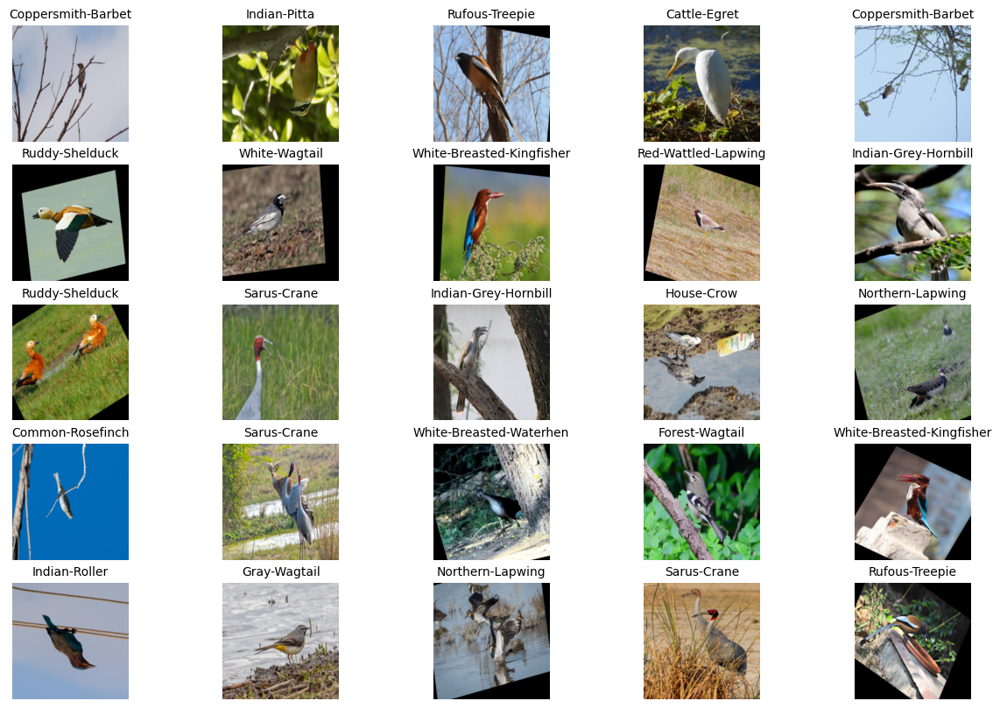

In [8]:
data_loader=torch.utils.data.DataLoader(trainset,batch_size=25,shuffle=True)
images,labels=next(iter(data_loader))
fig,ax=plt.subplots(5,5,figsize=(15,10))
class_names=trainset.classes
for i in range(5):
    for j in range(5):
        idx=i*5+j
        
        ax[i,j].imshow(images[idx].permute(1,2,0))
        ax[i,j].set_title(class_names[labels[idx].item()],fontsize=10)
        ax[i,j].axis("off")
plt.show()

# Get 25 random images from the testset

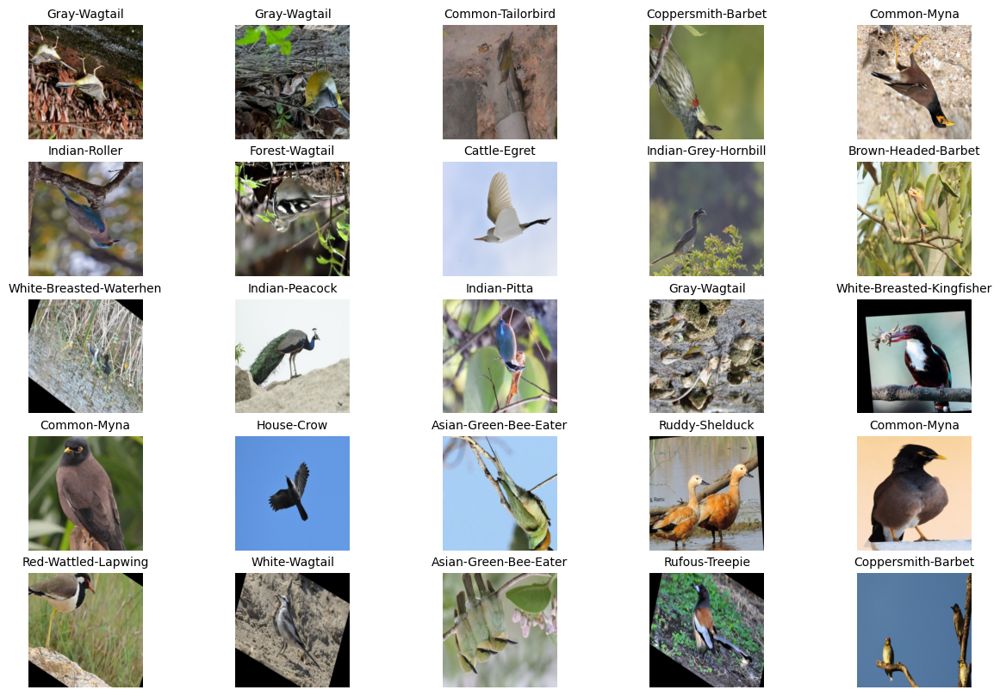

In [9]:
data_loader=torch.utils.data.DataLoader(testset,batch_size=25,shuffle=True)
images,labels=next(iter(data_loader))
fig,ax=plt.subplots(5,5,figsize=(15,10))
class_names=testset.classes
for i in range(5):
    for j in range(5):
        idx=i*5+j
        
        ax[i,j].imshow(images[idx].permute(1,2,0))
        ax[i,j].set_title(class_names[labels[idx].item()],fontsize=10)
        ax[i,j].axis("off")
plt.show()

# compare each class length from train data

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


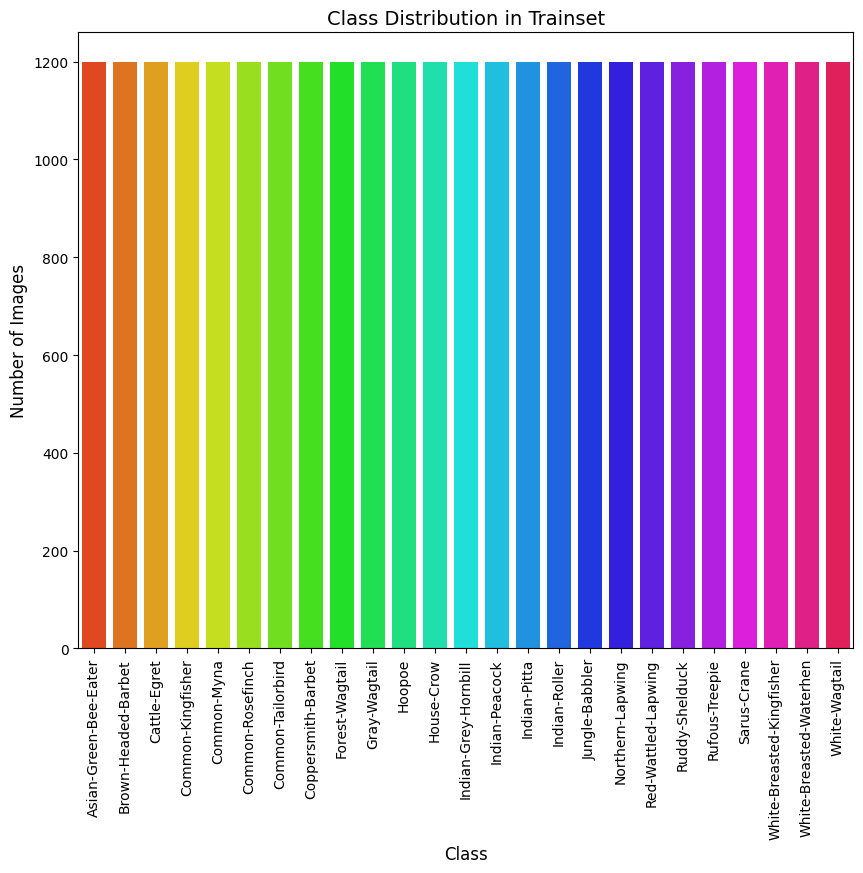

In [10]:
class_counts = Counter(trainset.targets)
class_names = trainset.classes
class_counts = {class_names[k]: v for k, v in class_counts.items()}

plt.figure(figsize=(10,8))
sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()), palette="hsv")

plt.xlabel("Class", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.xticks(rotation=90)
plt.title("Class Distribution in Trainset", fontsize=14)

plt.show()

# compare each class length from test data

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


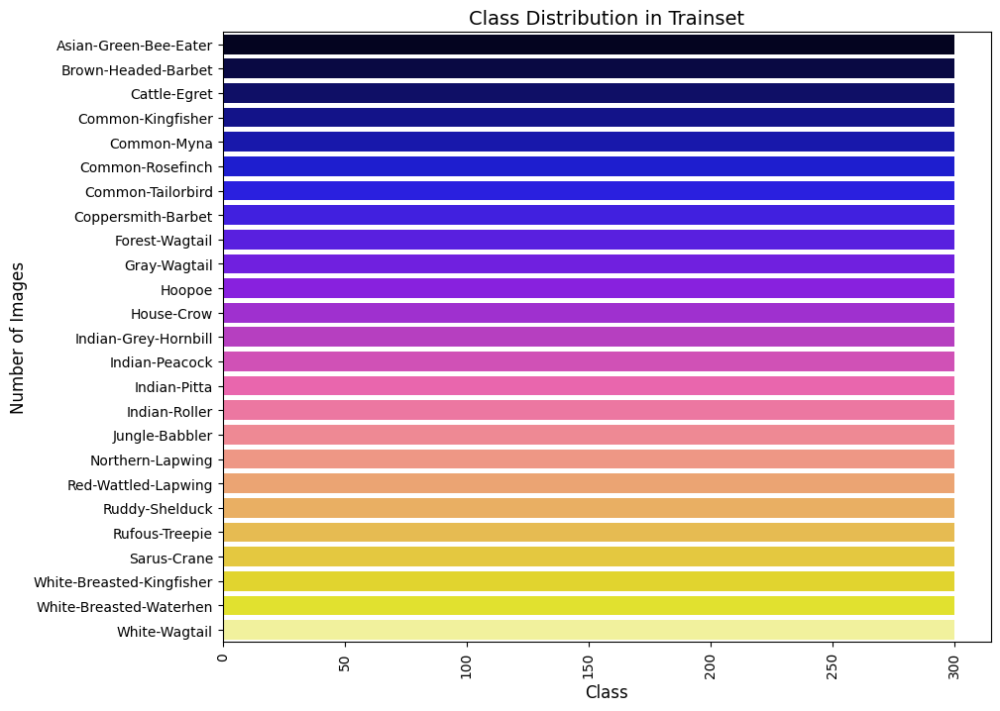

In [11]:
class_counts = Counter(testset.targets)
class_names = testset.classes
class_counts = {class_names[k]: v for k, v in class_counts.items()}

plt.figure(figsize=(10,8))
sns.barplot(y=list(class_counts.keys()), x=list(class_counts.values()), palette="gnuplot2")

plt.xlabel("Class", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.xticks(rotation=90)
plt.title("Class Distribution in Trainset", fontsize=14)

plt.show()

# create data Loader

In [12]:
train_data_loader=torch.utils.data.DataLoader(trainset,batch_size=16,shuffle=True,num_workers=8)
test_data_loader=torch.utils.data.DataLoader(testset,batch_size=16,shuffle=False,num_workers=8)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


# Using Iter and Next() for load batches

In [13]:
dataiter = iter(train_data_loader)

# We use next to get the first batch of data from our iterator
images, labels = next(dataiter)

print(images.shape)
print(labels.shape)

torch.Size([16, 3, 224, 224])
torch.Size([16])


# Create Model

In [14]:
class Bird_Image_Classifier_Simplified_Enhanced(nn.Module):
    def __init__(self, num_classes=25):
        super(Bird_Image_Classifier_Simplified_Enhanced, self).__init__()
        
        # First block (increased filters)
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, 128, kernel_size=3, padding=1),  # Increased filters
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )
        
        # Second block (increased filters)
        self.conv2 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),  # Increased filters
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )
        
        # Third block (added another convolutional layer)
        self.conv3 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, padding=1),  # Added more filters
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )
        
        # Fourth block (added depth with extra convolution)
        self.conv4 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, padding=1),  # More filters
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )
        
        # Classifier (increased number of units)
        self.classifier = nn.Sequential(
            nn.Linear(512 * 14 * 14, 1024),  # Adjusted based on increased filters
            nn.BatchNorm1d(1024),
            nn.ReLU(),
            nn.Dropout(0.4),  # Increased dropout
            nn.Linear(1024, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = x.view(x.size(0), -1)  # Flatten
        x = self.classifier(x)
        return x

# Model instantiation
model = Bird_Image_Classifier_Simplified_Enhanced()
summary(model, input_size=[16, 3, 224, 224])


Layer (type:depth-idx)                        Output Shape              Param #
Bird_Image_Classifier_Simplified_Enhanced     [16, 25]                  --
├─Sequential: 1-1                             [16, 128, 112, 112]       --
│    └─Conv2d: 2-1                            [16, 128, 224, 224]       3,584
│    └─BatchNorm2d: 2-2                       [16, 128, 224, 224]       256
│    └─ReLU: 2-3                              [16, 128, 224, 224]       --
│    └─MaxPool2d: 2-4                         [16, 128, 112, 112]       --
├─Sequential: 1-2                             [16, 256, 56, 56]         --
│    └─Conv2d: 2-5                            [16, 256, 112, 112]       295,168
│    └─BatchNorm2d: 2-6                       [16, 256, 112, 112]       512
│    └─ReLU: 2-7                              [16, 256, 112, 112]       --
│    └─MaxPool2d: 2-8                         [16, 256, 56, 56]         --
├─Sequential: 1-3                             [16, 512, 28, 28]         --
│    └─Con

# Loss Function & Optimizer

In [15]:
import torch.optim as optim
optimizer = torch.optim.AdamW(model.parameters(), lr=0.00005, weight_decay=0.003,betas=(0.9,0.999))

criterion = nn.CrossEntropyLoss()
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer,mode='max',factor=0.2,patience=3,verbose=True)

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [16]:


# We loop over the training dataset multiple times (each time is called an epoch)
epochs = 10

# Create empty arrays to store logs
epoch_log = []
train_loss_log = []
train_accuracy_log = []
test_loss_log = []
test_accuracy_log = []

# Initialize best accuracy for scheduler
best_test_accuracy = 0

# Iterate for a specified number of epochs
for epoch in range(epochs):  
    print(f'Starting Epoch: {epoch+1}...')

    # Initialize variables for training loss and accuracy
    running_loss = 0.0
    correct_train = 0
    total_train = 0

    # Set model to training mode
    model.train()

    # Create tqdm progress bar for training loop
    train_progress = tqdm(train_data_loader, desc=f'Epoch {epoch+1} Training', unit='batch')

    # Iterate through our train_data_loader iterator (mini-batches)
    for data in train_progress:
        inputs, labels = data

        # Move data to GPU
        inputs, labels = inputs.to(device), labels.to(device)

        # Ensure labels are long type for CrossEntropyLoss
        labels = labels.long()

        # Clear gradients before training
        optimizer.zero_grad()

        # Forward pass
        outputs = model(inputs)

        # Calculate loss
        loss = criterion(outputs, labels)

        # Backpropagation and optimization
        loss.backward()
        optimizer.step()

        # Update running loss
        running_loss += loss.item()

        # Calculate training accuracy
        _, predicted = torch.max(outputs.data, dim=1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()

        # Update tqdm progress bar
        train_progress.set_postfix(loss=loss.item(), accuracy=100 * correct_train / total_train)

    # Calculate training loss and accuracy after each epoch
    train_loss = running_loss / len(train_data_loader)
    train_accuracy = 100 * correct_train / total_train

    # Initialize variables for test loss and accuracy
    running_test_loss = 0.0
    correct_test = 0
    total_test = 0

    # Set model to evaluation mode
    model.eval()

    # We don't need gradients for validation, so we wrap it in no_grad()
    with torch.no_grad():
        # Create tqdm progress bar for testing loop
        test_progress = tqdm(test_data_loader, desc=f'Epoch {epoch+1} Testing', unit='batch')

        for data in test_progress:
            images, labels = data
            images, labels = images.to(device), labels.to(device)

            # Ensure labels are long type
            labels = labels.long()

            # Forward pass on the test data
            outputs = model(images)

            # Calculate loss
            test_loss = criterion(outputs, labels)
            running_test_loss += test_loss.item()

            # Calculate test accuracy
            _, predicted = torch.max(outputs.data, dim=1)
            total_test += labels.size(0)
            correct_test += (predicted == labels).sum().item()

            # Update tqdm progress bar
            test_progress.set_postfix(loss=test_loss.item(), accuracy=100 * correct_test / total_test)

    # Calculate test loss and accuracy after each epoch
    test_loss = running_test_loss / len(test_data_loader)
    test_accuracy = 100 * correct_test / total_test

    # Step the scheduler based on test accuracy
    scheduler.step(test_accuracy)

    # Log training and testing metrics
    epoch_num = epoch + 1
    epoch_log.append(epoch_num)
    train_loss_log.append(train_loss)
    train_accuracy_log.append(train_accuracy)
    test_loss_log.append(test_loss)
    test_accuracy_log.append(test_accuracy)

    # Create table to display the results
    results_table = [
        ["Epoch", epoch_num],
        ["Train Loss", f"{train_loss:.3f}"],
        ["Train Accuracy", f"{train_accuracy:.3f}%"],
        ["Test Loss", f"{test_loss:.3f}"],
        ["Test Accuracy", f"{test_accuracy:.3f}%"],
        ["Learning Rate", f"{optimizer.param_groups[0]['lr']:.6f}"]  # Added learning rate display
    ]
    
    # Print the table using tabulate
    print(tabulate(results_table, headers=["Metric", "Value"], tablefmt="fancy_grid"))
    
print('Finished Training')

Starting Epoch: 1...


Epoch 1 Testing: 100%|██████████| 469/469 [00:40<00:00, 11.63batch/s, accuracy=55.2, loss=1.44] 


╒════════════════╤══════════╕
│ Metric         │ Value    │
╞════════════════╪══════════╡
│ Epoch          │ 1        │
├────────────────┼──────────┤
│ Train Loss     │ 2.132    │
├────────────────┼──────────┤
│ Train Accuracy │ 36.970%  │
├────────────────┼──────────┤
│ Test Loss      │ 1.544    │
├────────────────┼──────────┤
│ Test Accuracy  │ 55.213%  │
├────────────────┼──────────┤
│ Learning Rate  │ 0.000050 │
╘════════════════╧══════════╛
Starting Epoch: 2...


Epoch 2 Testing: 100%|██████████| 469/469 [00:39<00:00, 11.73batch/s, accuracy=66.9, loss=0.834]


╒════════════════╤══════════╕
│ Metric         │ Value    │
╞════════════════╪══════════╡
│ Epoch          │ 2        │
├────────────────┼──────────┤
│ Train Loss     │ 1.439    │
├────────────────┼──────────┤
│ Train Accuracy │ 57.587%  │
├────────────────┼──────────┤
│ Test Loss      │ 1.165    │
├────────────────┼──────────┤
│ Test Accuracy  │ 66.947%  │
├────────────────┼──────────┤
│ Learning Rate  │ 0.000050 │
╘════════════════╧══════════╛
Starting Epoch: 3...


Epoch 3 Testing: 100%|██████████| 469/469 [00:40<00:00, 11.62batch/s, accuracy=72.5, loss=1.22]  


╒════════════════╤══════════╕
│ Metric         │ Value    │
╞════════════════╪══════════╡
│ Epoch          │ 3        │
├────────────────┼──────────┤
│ Train Loss     │ 1.102    │
├────────────────┼──────────┤
│ Train Accuracy │ 67.310%  │
├────────────────┼──────────┤
│ Test Loss      │ 0.930    │
├────────────────┼──────────┤
│ Test Accuracy  │ 72.520%  │
├────────────────┼──────────┤
│ Learning Rate  │ 0.000050 │
╘════════════════╧══════════╛
Starting Epoch: 4...


Epoch 4 Testing: 100%|██████████| 469/469 [00:40<00:00, 11.53batch/s, accuracy=74.7, loss=0.899] 


╒════════════════╤══════════╕
│ Metric         │ Value    │
╞════════════════╪══════════╡
│ Epoch          │ 4        │
├────────────────┼──────────┤
│ Train Loss     │ 0.850    │
├────────────────┼──────────┤
│ Train Accuracy │ 75.457%  │
├────────────────┼──────────┤
│ Test Loss      │ 0.865    │
├────────────────┼──────────┤
│ Test Accuracy  │ 74.733%  │
├────────────────┼──────────┤
│ Learning Rate  │ 0.000050 │
╘════════════════╧══════════╛
Starting Epoch: 5...


Epoch 5 Testing: 100%|██████████| 469/469 [00:39<00:00, 11.78batch/s, accuracy=76.9, loss=0.752] 


╒════════════════╤══════════╕
│ Metric         │ Value    │
╞════════════════╪══════════╡
│ Epoch          │ 5        │
├────────────────┼──────────┤
│ Train Loss     │ 0.637    │
├────────────────┼──────────┤
│ Train Accuracy │ 81.650%  │
├────────────────┼──────────┤
│ Test Loss      │ 0.759    │
├────────────────┼──────────┤
│ Test Accuracy  │ 76.920%  │
├────────────────┼──────────┤
│ Learning Rate  │ 0.000050 │
╘════════════════╧══════════╛
Starting Epoch: 6...


Epoch 6 Testing: 100%|██████████| 469/469 [00:39<00:00, 11.76batch/s, accuracy=78.5, loss=0.768]  


╒════════════════╤══════════╕
│ Metric         │ Value    │
╞════════════════╪══════════╡
│ Epoch          │ 6        │
├────────────────┼──────────┤
│ Train Loss     │ 0.472    │
├────────────────┼──────────┤
│ Train Accuracy │ 86.353%  │
├────────────────┼──────────┤
│ Test Loss      │ 0.730    │
├────────────────┼──────────┤
│ Test Accuracy  │ 78.507%  │
├────────────────┼──────────┤
│ Learning Rate  │ 0.000050 │
╘════════════════╧══════════╛
Starting Epoch: 7...


Epoch 7 Testing: 100%|██████████| 469/469 [00:40<00:00, 11.59batch/s, accuracy=78.8, loss=0.405] 


╒════════════════╤══════════╕
│ Metric         │ Value    │
╞════════════════╪══════════╡
│ Epoch          │ 7        │
├────────────────┼──────────┤
│ Train Loss     │ 0.340    │
├────────────────┼──────────┤
│ Train Accuracy │ 90.533%  │
├────────────────┼──────────┤
│ Test Loss      │ 0.694    │
├────────────────┼──────────┤
│ Test Accuracy  │ 78.840%  │
├────────────────┼──────────┤
│ Learning Rate  │ 0.000050 │
╘════════════════╧══════════╛
Starting Epoch: 8...


Epoch 8 Testing: 100%|██████████| 469/469 [00:39<00:00, 11.86batch/s, accuracy=78.4, loss=0.664] 


╒════════════════╤══════════╕
│ Metric         │ Value    │
╞════════════════╪══════════╡
│ Epoch          │ 8        │
├────────────────┼──────────┤
│ Train Loss     │ 0.245    │
├────────────────┼──────────┤
│ Train Accuracy │ 93.597%  │
├────────────────┼──────────┤
│ Test Loss      │ 0.731    │
├────────────────┼──────────┤
│ Test Accuracy  │ 78.427%  │
├────────────────┼──────────┤
│ Learning Rate  │ 0.000050 │
╘════════════════╧══════════╛
Starting Epoch: 9...


Epoch 9 Testing: 100%|██████████| 469/469 [00:40<00:00, 11.69batch/s, accuracy=78.5, loss=0.397]  


╒════════════════╤══════════╕
│ Metric         │ Value    │
╞════════════════╪══════════╡
│ Epoch          │ 9        │
├────────────────┼──────────┤
│ Train Loss     │ 0.190    │
├────────────────┼──────────┤
│ Train Accuracy │ 94.797%  │
├────────────────┼──────────┤
│ Test Loss      │ 0.731    │
├────────────────┼──────────┤
│ Test Accuracy  │ 78.467%  │
├────────────────┼──────────┤
│ Learning Rate  │ 0.000050 │
╘════════════════╧══════════╛
Starting Epoch: 10...


Epoch 10 Testing: 100%|██████████| 469/469 [00:40<00:00, 11.52batch/s, accuracy=78.6, loss=0.268]  

╒════════════════╤══════════╕
│ Metric         │ Value    │
╞════════════════╪══════════╡
│ Epoch          │ 10       │
├────────────────┼──────────┤
│ Train Loss     │ 0.158    │
├────────────────┼──────────┤
│ Train Accuracy │ 95.690%  │
├────────────────┼──────────┤
│ Test Loss      │ 0.734    │
├────────────────┼──────────┤
│ Test Accuracy  │ 78.640%  │
├────────────────┼──────────┤
│ Learning Rate  │ 0.000050 │
╘════════════════╧══════════╛
Finished Training


In [17]:
path="/kaggle/working/my_model_dir"
os.makedirs(path,exist_ok=True)
print(f"Directory created : {path}")

Directory created : /kaggle/working/my_model_dir


In [18]:
model_path = os.path.join(path, "avian_classifier.pth")
torch.save(model.state_dict(),model_path)

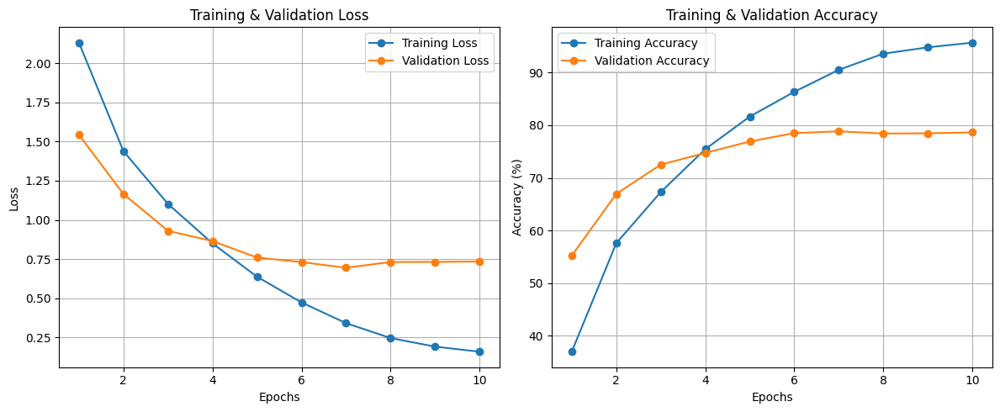

In [19]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(epoch_log, train_loss_log, label='Training Loss', marker='o')
plt.plot(epoch_log, test_loss_log, label='Validation Loss', marker='o')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training & Validation Loss')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(epoch_log, train_accuracy_log, label='Training Accuracy', marker='o')
plt.plot(epoch_log, test_accuracy_log, label='Validation Accuracy', marker='o')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.title('Training & Validation Accuracy')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


In [20]:
class_names=train_data_loader.dataset.classes
num_classes=len(class_names)
model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    test_progress = tqdm(test_data_loader, desc="Generating Predictions", unit="batch")
    
    for data in test_progress:
        images, labels = data
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())


Generating Predictions: 100%|██████████| 469/469 [00:39<00:00, 11.93batch/s]


# Confusion Matrix

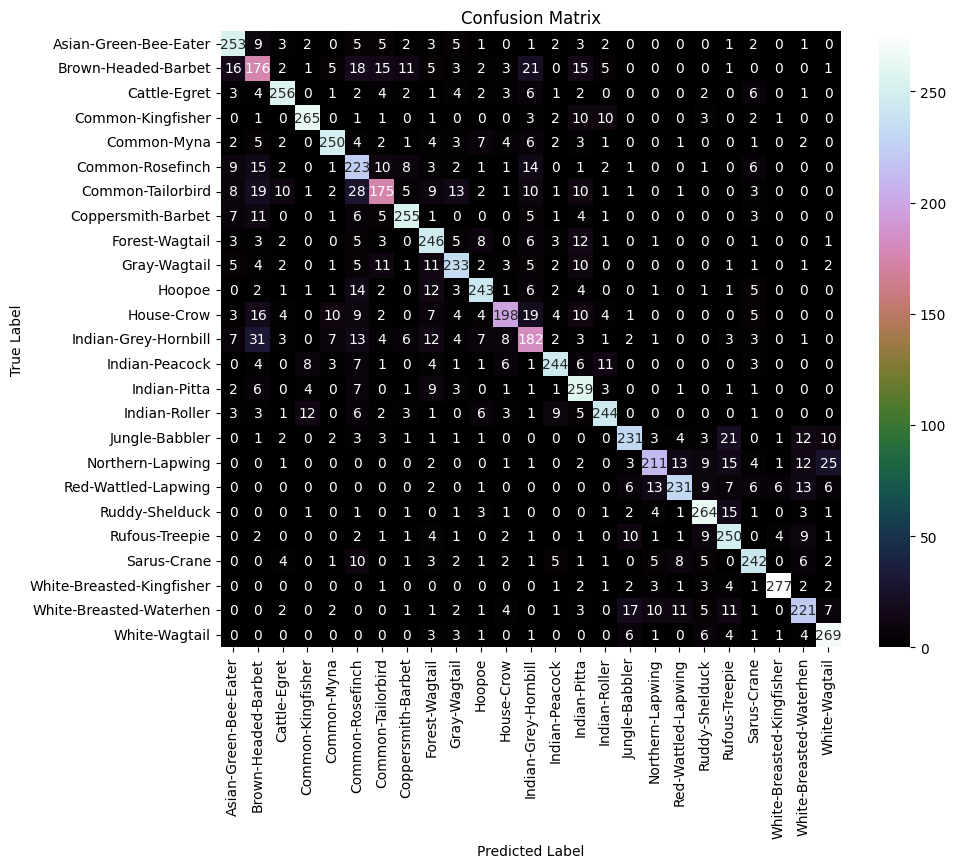

In [21]:
cm = confusion_matrix(all_labels, all_preds)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt="d", cmap="cubehelix", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()


# Classification Report

In [22]:
print(classification_report(all_labels,all_preds,target_names=class_names))

                           precision    recall  f1-score   support

    Asian-Green-Bee-Eater       0.79      0.84      0.81       300
      Brown-Headed-Barbet       0.56      0.59      0.58       300
             Cattle-Egret       0.86      0.85      0.86       300
        Common-Kingfisher       0.90      0.88      0.89       300
              Common-Myna       0.87      0.83      0.85       300
         Common-Rosefinch       0.60      0.74      0.67       300
        Common-Tailorbird       0.71      0.58      0.64       300
       Coppersmith-Barbet       0.85      0.85      0.85       300
           Forest-Wagtail       0.71      0.82      0.76       300
             Gray-Wagtail       0.80      0.78      0.79       300
                   Hoopoe       0.83      0.81      0.82       300
               House-Crow       0.82      0.66      0.73       300
     Indian-Grey-Hornbill       0.63      0.61      0.62       300
           Indian-Peacock       0.86      0.81      0.84     

# Roc Curve

Computing Probabilities:   0%|          | 0/469 [00:00<?, ?batch/s]/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
Computing Probabilities: 100%|██████████| 469/469 [00:38<00:00, 12.03batch/s]


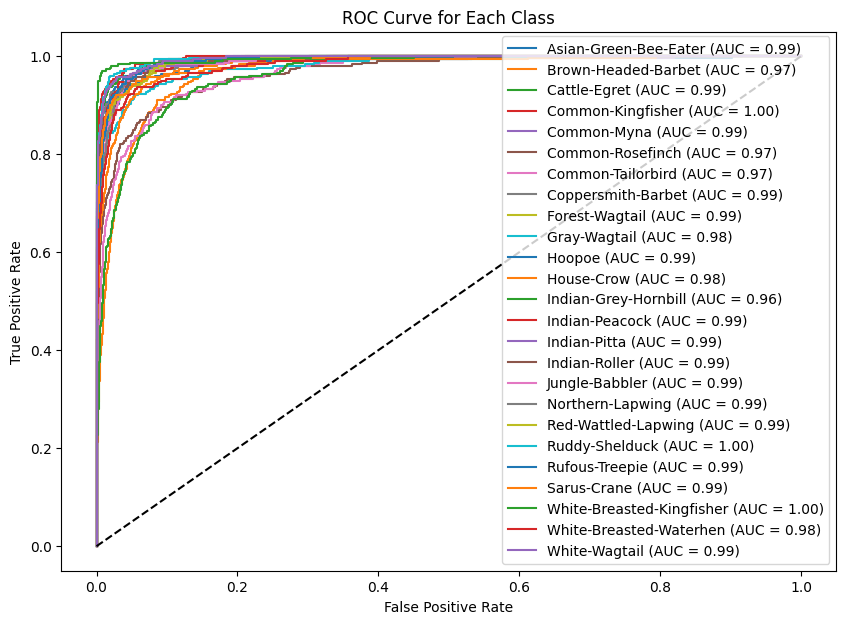

In [23]:


num_classes = len(class_names)
all_labels_one_hot = label_binarize(all_labels, classes=np.arange(num_classes))

with torch.no_grad():
    all_outputs = []
    for data in tqdm(test_data_loader, desc="Computing Probabilities", unit="batch"):
        images, _ = data
        images = images.to(device)
        outputs = model(images)
        all_outputs.extend(outputs.cpu().numpy())

all_outputs = np.array(all_outputs)
all_probs = torch.nn.functional.softmax(torch.tensor(all_outputs), dim=1).numpy()

plt.figure(figsize=(10, 7))
for i, class_name in enumerate(class_names):
    fpr, tpr, _ = roc_curve(all_labels_one_hot[:, i], all_probs[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{class_name} (AUC = {roc_auc:.2f})")

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve for Each Class")
plt.legend(loc="lower right")
plt.show()


# Precision Recall curve

Computing Probabilities:   0%|          | 0/469 [00:00<?, ?batch/s]/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
Computing Probabilities: 100%|██████████| 469/469 [00:39<00:00, 11.84batch/s]


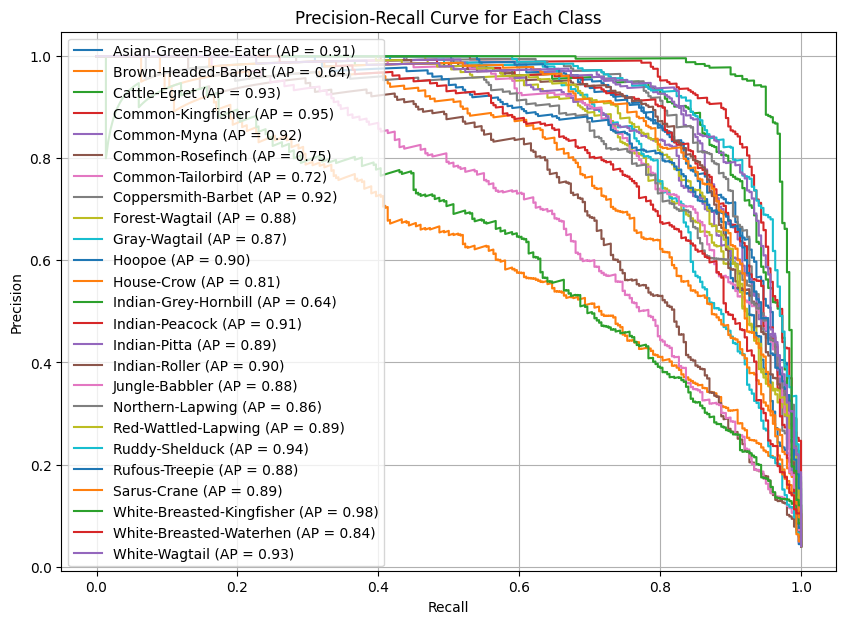

In [24]:

from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.preprocessing import label_binarize

num_classes = len(class_names)
all_labels_one_hot = label_binarize(all_labels, classes=np.arange(num_classes))

with torch.no_grad():
    all_outputs = []
    for data in tqdm(test_data_loader, desc="Computing Probabilities", unit="batch"):
        images, _ = data
        images = images.to(device)
        outputs = model(images)
        all_outputs.extend(outputs.cpu().numpy())

all_outputs = np.array(all_outputs)
all_probs = torch.nn.functional.softmax(torch.tensor(all_outputs), dim=1).numpy()

plt.figure(figsize=(10, 7))
for i, class_name in enumerate(class_names):
    precision, recall, _ = precision_recall_curve(all_labels_one_hot[:, i], all_probs[:, i])
    avg_precision = average_precision_score(all_labels_one_hot[:, i], all_probs[:, i])
    plt.plot(recall, precision, label=f"{class_name} (AP = {avg_precision:.2f})")

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve for Each Class")
plt.legend(loc="best")
plt.grid()
plt.show()


In [25]:


class_correct = [0. for _ in range(num_classes)]
class_total = [0. for _ in range(num_classes)]

# We don't need gradients for validation
with torch.no_grad():
    test_progress = tqdm(test_data_loader, desc="Evaluating", unit="batch")
    
    for data in test_progress:
        images, labels = data

        # Move data to GPU
        images, labels = images.to(device), labels.to(device)

        # Get predictions
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)

        c = (predicted == labels).squeeze()

        # Iterate dynamically based on batch size
        for i in range(labels.shape[0]):  
            label = labels[i].item()  # Ensure it's an integer index
            class_correct[label] += c[i].item()
            class_total[label] += 1

# Print accuracy for each class
for i in range(num_classes):
    if class_total[i] > 0:  # Avoid division by zero
        class_accuracy = 100 * class_correct[i] / class_total[i]
        print(f'Accuracy of {class_names[i]}: {class_accuracy:.3f}%')
    else:
        print(f'Accuracy of {class_names[i]}: No samples found')


Evaluating:   0%|          | 0/469 [00:00<?, ?batch/s]/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
Evaluating: 100%|██████████| 469/469 [00:39<00:00, 11.94batch/s]

Accuracy of Asian-Green-Bee-Eater: 84.333%
Accuracy of Brown-Headed-Barbet: 58.667%
Accuracy of Cattle-Egret: 85.333%
Accuracy of Common-Kingfisher: 88.333%
Accuracy of Common-Myna: 83.333%
Accuracy of Common-Rosefinch: 74.333%
Accuracy of Common-Tailorbird: 58.333%
Accuracy of Coppersmith-Barbet: 85.000%
Accuracy of Forest-Wagtail: 82.000%
Accuracy of Gray-Wagtail: 77.667%
Accuracy of Hoopoe: 81.000%
Accuracy of House-Crow: 66.000%
Accuracy of Indian-Grey-Hornbill: 60.667%
Accuracy of Indian-Peacock: 81.333%
Accuracy of Indian-Pitta: 86.333%
Accuracy of Indian-Roller: 81.333%
Accuracy of Jungle-Babbler: 77.000%
Accuracy of Northern-Lapwing: 70.333%
Accuracy of Red-Wattled-Lapwing: 77.000%
Accuracy of Ruddy-Shelduck: 88.000%
Accuracy of Rufous-Treepie: 83.333%
Accuracy of Sarus-Crane: 80.667%
Accuracy of White-Breasted-Kingfisher: 92.333%
Accuracy of White-Breasted-Waterhen: 73.667%
Accuracy of White-Wagtail: 89.667%


Processing Batches:   0%|          | 2/469 [00:01<06:57,  1.12batch/s]


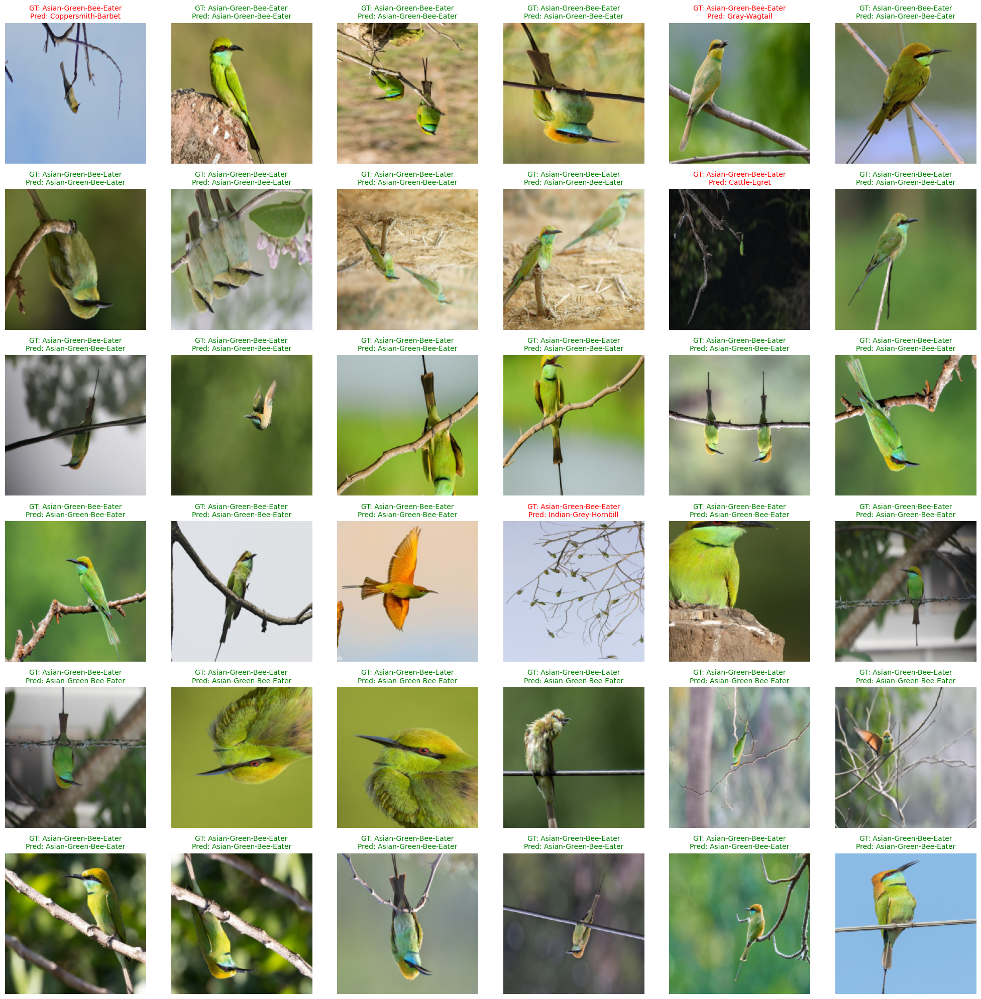

In [26]:


model.eval()

# Define the number of images to plot
num_images = 36  

# Create a figure for displaying images
fig, axes = plt.subplots(6, 6, figsize=(20,20))

# Assuming class_names is already defined, e.g.:
# class_names = ['class1', 'class2', ..., 'class10']

# No gradient calculations for efficiency
with torch.no_grad():
    images_plotted = 0  # Counter to track the number of images plotted
    
    # Use tqdm to show progress bar
    test_loader = tqdm(test_data_loader, desc="Processing Batches", unit="batch")

    for data in test_loader:
        images, labels = data

        # Move to GPU if available
        images, labels = images.to(device), labels.to(device)

        # Model predictions
        outputs = model(images)
        predictions = torch.argmax(outputs, dim=1)

        for i in range(images.shape[0]):
            pred = predictions[i].item()
            label = labels[i].item()

            # Select subplot
            ax = axes[images_plotted // 6, images_plotted % 6]

            # Convert tensor image to numpy and transpose (C, H, W) → (H, W, C)
            img = images[i].cpu().numpy().transpose(1, 2, 0)

            # Display the image
            ax.imshow(img)  # Remove cmap='gray' since it's RGB
            ax.axis('off')

            # Map the numeric labels to class names
            label_name = class_names[label]
            pred_name = class_names[pred]

            # Title color based on correctness
            color = 'green' if pred == label else 'red'
            ax.set_title(f'GT: {label_name}\nPred: {pred_name}', color=color, fontsize=10)

            images_plotted += 1

            # Stop once we plot 36 images
            if images_plotted >= num_images:
                break
        
        if images_plotted >= num_images:
            break

plt.tight_layout()
plt.show()


Generating Predictions: 100%|██████████| 469/469 [00:39<00:00, 11.79batch/s]


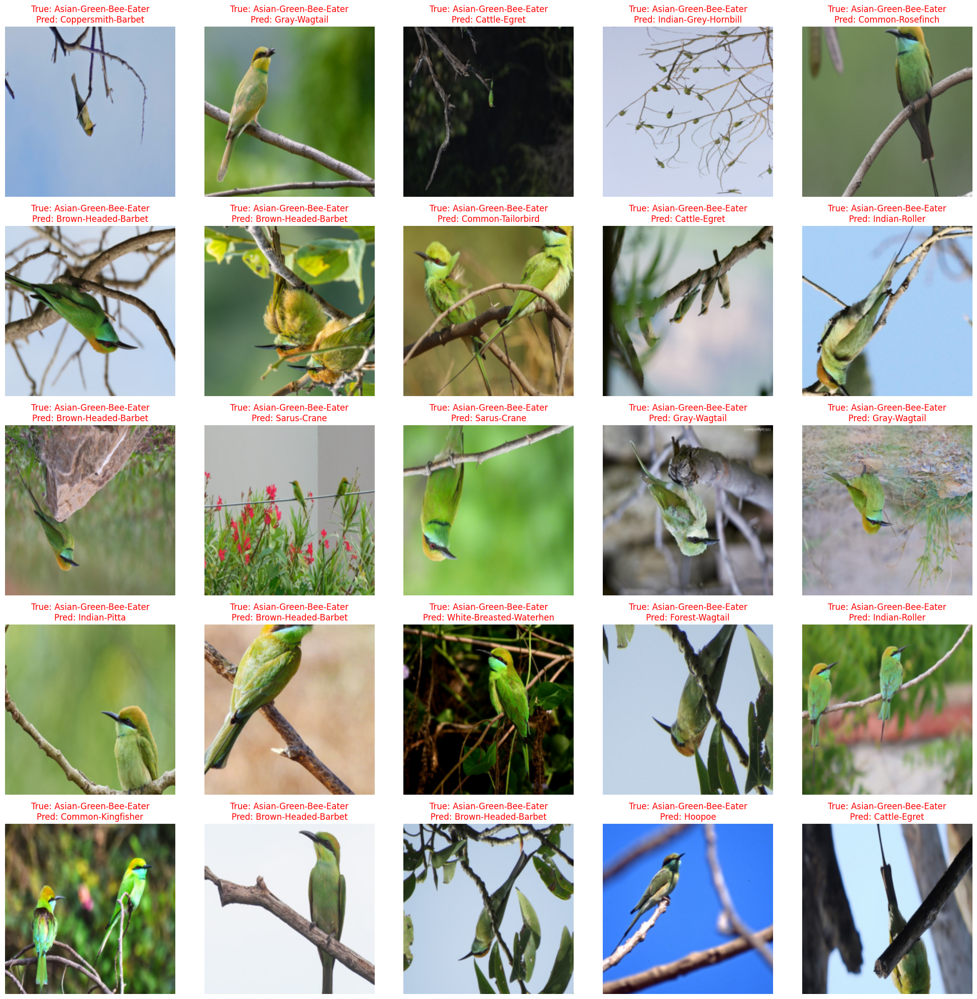

In [27]:


# Assuming `train_data_loader.dataset.classes` and the model are already defined

# Get class names and other parameters
class_names = train_data_loader.dataset.classes
num_classes = len(class_names)

model.eval()

# Lists to store predictions and true labels
all_preds = []
all_labels = []
misclassified_images = []
misclassified_labels = []
misclassified_preds = []

# Iterate through the test data and collect predictions and misclassifications
with torch.no_grad():
    test_progress = tqdm(test_data_loader, desc="Generating Predictions", unit="batch")
    
    for data in test_progress:
        images, labels = data
        images, labels = images.to(device), labels.to(device)
        
        # Get model predictions
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        
        # Compare predictions and labels, and store misclassified images
        for i in range(len(predicted)):
            if predicted[i] != labels[i]:
                misclassified_images.append(images[i].cpu().numpy())
                misclassified_labels.append(labels[i].cpu().item())
                misclassified_preds.append(predicted[i].cpu().item())
        
        # Extend the predictions and labels lists
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Plot misclassified images in a 5x5 grid
num_misclassified = len(misclassified_images)
num_images = min(25, num_misclassified)  # Plot only 25 images or the number of misclassified images

# Create a figure for displaying the images
fig, axes = plt.subplots(5, 5, figsize=(20,20))

for i in range(num_images):
    ax = axes[i // 5, i % 5]
    
    # Convert image to proper format for displaying
    img = misclassified_images[i].transpose(1, 2, 0)  # Change from (C, H, W) to (H, W, C)
    
    # Display the image
    ax.imshow(img)
    ax.axis('off')
    
    # Get the true and predicted labels
    true_label = class_names[misclassified_labels[i]]
    predicted_label = class_names[misclassified_preds[i]]
    
    # Set the title with green if correct, red if incorrect
    ax.set_title(f'True: {true_label}\nPred: {predicted_label}', color='red')

plt.tight_layout()
plt.show()


In [28]:


# Get class names and other parameters
class_names = train_data_loader.dataset.classes
num_classes = len(class_names)

model.eval()

# Initialize misclassification counters for each class
class_misclassified = {class_name: 0 for class_name in class_names}

# Iterate through the test data and collect misclassifications
with torch.no_grad():
    test_progress = tqdm(test_data_loader, desc="Generating Predictions", unit="batch")
    
    for data in test_progress:
        images, labels = data
        images, labels = images.to(device), labels.to(device)
        
        # Get model predictions
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        
        # Compare predictions and labels, and update the misclassification counts
        for i in range(len(predicted)):
            if predicted[i] != labels[i]:
                true_label = labels[i].cpu().item()
                class_misclassified[class_names[true_label]] += 1

# Print the number of misclassified samples for each class
for class_name, misclassified_count in class_misclassified.items():
    print(f'Misclassified {class_name}: {misclassified_count}')


Generating Predictions: 100%|██████████| 469/469 [00:39<00:00, 11.76batch/s]

Misclassified Asian-Green-Bee-Eater: 47
Misclassified Brown-Headed-Barbet: 124
Misclassified Cattle-Egret: 44
Misclassified Common-Kingfisher: 35
Misclassified Common-Myna: 50
Misclassified Common-Rosefinch: 77
Misclassified Common-Tailorbird: 125
Misclassified Coppersmith-Barbet: 45
Misclassified Forest-Wagtail: 54
Misclassified Gray-Wagtail: 67
Misclassified Hoopoe: 57
Misclassified House-Crow: 102
Misclassified Indian-Grey-Hornbill: 118
Misclassified Indian-Peacock: 56
Misclassified Indian-Pitta: 41
Misclassified Indian-Roller: 56
Misclassified Jungle-Babbler: 69
Misclassified Northern-Lapwing: 89
Misclassified Red-Wattled-Lapwing: 69
Misclassified Ruddy-Shelduck: 36
Misclassified Rufous-Treepie: 50
Misclassified Sarus-Crane: 58
Misclassified White-Breasted-Kingfisher: 23
Misclassified White-Breasted-Waterhen: 79
Misclassified White-Wagtail: 31


In [29]:
! pip install gradio

In [30]:

import gradio as gr
from torchvision import transforms
from PIL import Image

path = "/kaggle/working/my_model_dir/avian_classifier.pth"

model.load_state_dict(torch.load(path, weights_only=True))
model.eval()

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

def predict(image):
    image = Image.fromarray(image)
    image = transform(image).unsqueeze(0)
    image = image.to("cuda")  # Assuming using GPU, else use "cpu"
    
    with torch.no_grad():
        output = model(image)
    
    _, predicted = torch.max(output, 1)
    return class_names[predicted.item()]

iface = gr.Interface(fn=predict, 
                     inputs=gr.Image(type="numpy", image_mode="RGB"),
                     outputs="text",
                     live=False,
                     title="Avian Classifier",
                     description="Upload an image of a bird to get its predicted class")

iface.launch()


* Running on local URL:  http://127.0.0.1:7860
Kaggle notebooks require sharing enabled. Setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

* Running on public URL: https://0215786238d028388a.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
